# **Image Caption with BLIP2**
###### **REFERENCE:** https://huggingface.co/blog/blip-2#image-captioning


**** 1. This will create the caption for one image of the roomscene



In [ ]:
# Install dependencies
!pip install git+https://github.com/huggingface/transformers.git
!pip install torch
!pip install accelerate

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-2u0w_ddx
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-2u0w_ddx
  Resolved https://github.com/huggingface/transformers.git to commit 09b2de6eb74b1e5ff4f4c3d9839485f4165627c9
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 89.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 80.5 MB/s eta 0:00:00
  Created wheel for transformers: filename=transformers-4.34.0.dev0-py3-none-any.whl size=7640036 sha256=700fddc18ea35b3a4c01edc5c2de4420a4ba243d5ed24fc5961bb3aae7be578c
  Stored in directory: /tmp/pip-ephem-wheel-cache-2z5chp6l/wheels/e7/9c/5b/e1a9c8007c343041e61cc484433d512ea9274272e3fcbe7c16


In [ ]:
# Load the data into a pandas dataframe:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


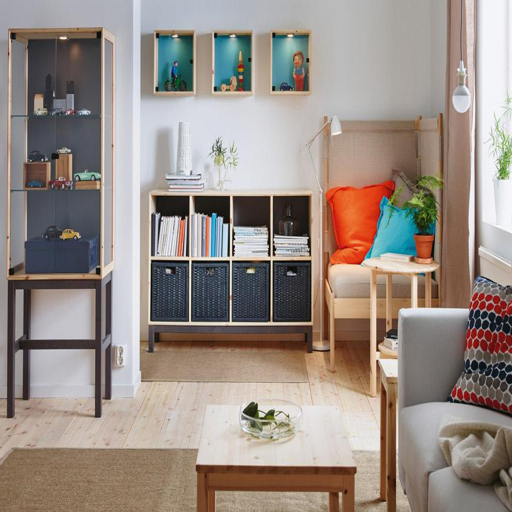

In [ ]:
# Input Image
from PIL import Image

jpg_file = '/content/drive/MyDrive/MTECH_IS_Project/SEM02/dataset/room_scenes/ikea-a-clean-way-to-display-or-tidy-away.__1364309466684-s4.jpg'
image = Image.open(jpg_file).convert('RGB')
display(image.resize((512, 512)))
# display(image.resize((512, 512)))

In [ ]:
# Load a BLIP-2 checkpoint that leverages the pre-trained OPT model by Meta AI, which has 2.7 billion parameters
# This ussually fails due to lack of resource - please make sure you have enough mem (or use collab pro v100)
from transformers import AutoProcessor, Blip2ForConditionalGeneration
import torch

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b", torch_dtype=torch.float16)


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
# Set to use GPU to make text generation faster
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)


Blip2ForConditionalGeneration(
  (vision_model): Blip2VisionModel(
    (embeddings): Blip2VisionEmbeddings(
      (patch_embedding): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (encoder): Blip2Encoder(
      (layers): ModuleList(
        (0-38): 39 x Blip2EncoderLayer(
          (self_attn): Blip2Attention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=1408, out_features=4224, bias=True)
            (projection): Linear(in_features=1408, out_features=1408, bias=True)
          )
          (layer_norm1): LayerNorm((1408,), eps=1e-05, elementwise_affine=True)
          (mlp): Blip2MLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1408, out_features=6144, bias=True)
            (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          )
          (layer_norm2): LayerNorm((1408,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((

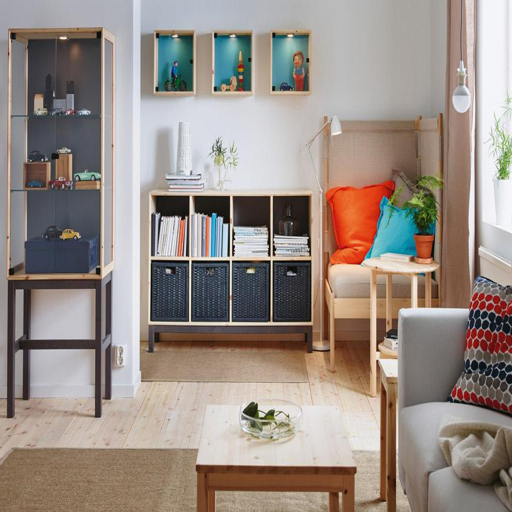

caption: a living room with a couch, coffee table and shelves


In [ ]:
# Image captioning
inputs = processor(image, return_tensors="pt").to(device, torch.float16)

generated_ids = model.generate(**inputs, max_new_tokens=20)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
# display(image.resize((596, 437)))
display(image.resize((512, 512)))
print('caption:',generated_text)


## **Bulk Image Captioning using BLIP2**

In [ ]:
**** 1. This will create the caption for all the images of the roomscene directory

In [ ]:
from PIL import Image
import os
import torch
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import pandas as pd

images_loc = '/content/drive/MyDrive/MTECH_IS_Project/SEM02/dataset/room_scenes'

def load_demo_images(image_folder, image_size, device):
    images = []
    for image_name in os.listdir(image_folder):
        if image_name.endswith(".jpg"):
          img_path = os.path.join(image_folder, image_name)
          raw_image = Image.open(img_path).convert('RGB')

          # display(raw_image.resize((596, 437)))

          w, h = raw_image.size
          display(raw_image.resize((w//5, h//5)))

          # transform = transforms.Compose([
          #     transforms.Resize((image_size, image_size), interpolation=InterpolationMode.BICUBIC),
          #     transforms.ToTensor(),
          #     transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
          # ])
          # image = transform(raw_image).unsqueeze(0).to(device)

          image = raw_image
          images.append(image)
    return images

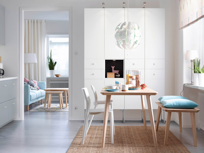

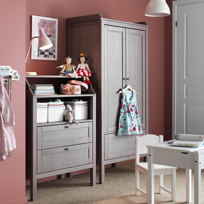

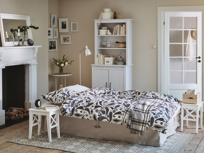

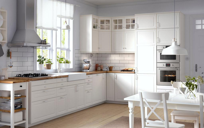

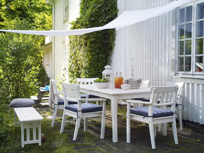

...

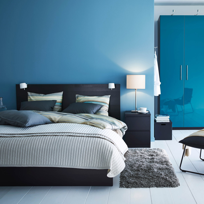

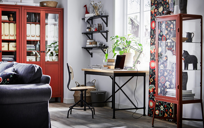

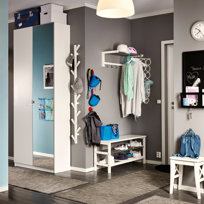

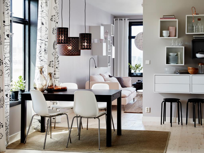

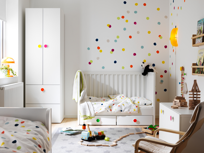

Image Name: ikea-crisp-modern-design-perfect-for-breakfast-time__1364308406824-s4
Caption: a kitchen with white cabinets and a table
Image Name: ikea-kid-friendly-storage-in-traditional-style__1364308477569-s4
Caption: a pink room with a wooden dresser and a white dresser
Image Name: ikea-living-room-by-day-sleeping-space-by-night.__1364309472217-s4
Caption: a bedroom with a bed, dresser and fireplace
Image Name: ikea-traditional-looks-meet-modern-versatility__1364308465624-s4
Caption: a kitchen with white cabinets and wooden floors
Image Name: ikea-traditional-long-lasting-furniture-for-every-generation__1364309710705-s4
Caption: a white table and chairs in a garden
Image Name: ikea-sometimes-storage-is-better-in-pairs__1364308453074-s4
Caption: a bedroom with a bed, a dresser, a lamp, and a white dresser
Image Name: ikea-balcony-organisers-for-the-urban-gardener__1364308450883-s4
Caption: a balcony with a table and potted plants
Image Name: ikea-a-sunny-space-for-celebrating-or-just-

In [ ]:
def get_blip2_caption():
  img_path = images_loc
  image_size = 512
  images = load_demo_images(img_path, image_size=image_size, device=device)

  # model_url = 'https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_base_capfilt_large.pth'
  # model = blip_decoder(pretrained=model_url, image_size=image_size, vit='base')
  # model.eval()
  # model = model.to(device)

  text_folder = img_path
  if not os.path.exists(text_folder):
      os.makedirs(text_folder)

  with torch.no_grad():
      cap_list = []
      cap_dict = {}
      cap_flag=False
      for i, image in enumerate(images):
        inputs = processor(image, return_tensors="pt").to(device, torch.float16)
        generated_ids = model.generate(**inputs, max_new_tokens=20)
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
        image_name = os.listdir(img_path + '/')[i]
        image_name = os.path.splitext(image_name)[0]
        print("Image Name:", image_name)
        print("Caption:", generated_text)
        cap_flag=True

        if cap_flag:
          cap_dict["filename"] = image_name
          cap_dict["caption"] = generated_text
        if bool(cap_dict):
          cap_list.append(cap_dict)
          cap_dict = {}


        # list_img_name.append(image_name)
        # list_text_cap.append(generated_text)
        # with open(os.path.join(text_folder, f"{image_name}.txt"), "w") as f:
        #     f.write(generated_text[0])

  return cap_list

# Create a DataFrame and process the paths

blip2_cap = get_blip2_caption()
image_df = pd.DataFrame(blip2_cap)
# image_df = pd.DataFrame({'filename': image_name, 'caption': generated_text}, index=[i])

print("###### CAPTIONING COMPLETED ######")

In [ ]:
image_df.head(5)

,filename,caption
0,ikea-crisp-modern-design-perfect-for-breakfast...,a kitchen with white cabinets and a table
1,ikea-kid-friendly-storage-in-traditional-style...,a pink room with a wooden dresser and a white ...
2,ikea-living-room-by-day-sleeping-space-by-nigh...,"a bedroom with a bed, dresser and fireplace"
3,ikea-traditional-looks-meet-modern-versatility...,a kitchen with white cabinets and wooden floors
4,ikea-traditional-long-lasting-furniture-for-ev...,a white table and chairs in a garden


In [ ]:
dataset_loc = '/content/drive/MyDrive/MTECH_IS_Project/SEM02/dataset/room_scenes_blip2.csv'
image_df.to_csv(dataset_loc,  encoding='utf-8')